<a href="https://colab.research.google.com/github/delvyaustin/DataAnalytics-Internship-Project/blob/master/Climate_NASA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVC
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

# Set the style for our plots
plt.style.use('fivethirtyeight')
sns.set(style='whitegrid')

# Download necessary NLTK data
try:
    nltk.download('punkt', quiet=True)
    nltk.download('stopwords', quiet=True)
    nltk.download('wordnet', quiet=True)
except:
    print("NLTK data already downloaded or error occurred")

print("1. Understanding the Problem")
print("-----------------------------")
print("The goal is to analyze NASA's climate change Facebook comments, understand public sentiment,")
print("identify trends, and build predictive models for climate change indicators.")

# 2. Dataset Preparation
print("\n2. Dataset Preparation")
print("---------------------")

# Define the path to the dataset
data_path = r'C:\Users\delvy\OneDrive\Desktop\Unified Mentor\climate_nasa.csv'
print(f"Loading dataset from: {data_path}")

# Load the dataset
try:
    df = pd.read_csv(data_path)
    print("Dataset loaded successfully!")
except Exception as e:
    print(f"Error loading dataset: {e}")
    exit()

# Display basic information about the dataset
print("\nDataset Overview:")
print(f"Shape: {df.shape}")
print("\nFirst few rows:")
print(df.head())

# Check for missing values
print("\nMissing values in each column:")
print(df.isnull().sum())

# Fill missing values if any
df.fillna({'LikesCount': 0, 'CommentsCount': 0}, inplace=True)
if 'Text' in df.columns:
    df = df.dropna(subset=['Text'])

# 3. Data Exploration and Visualization
print("\n3. Data Exploration and Visualization")
print("---------------------------------")

# Convert date column to datetime if available
if 'Date' in df.columns:
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df['Year'] = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month
    df['Day'] = df['Date'].dt.day

    # Time series visualization
    plt.figure(figsize=(12, 6))
    df.groupby('Year')['LikesCount'].mean().plot(kind='bar', color='skyblue')
    plt.title('Average Likes per Year')
    plt.ylabel('Average Likes')
    plt.tight_layout()
    plt.savefig('avg_likes_per_year.png')
    plt.close()

    plt.figure(figsize=(12, 6))
    df.groupby('Month')['LikesCount'].mean().plot(kind='bar', color='lightgreen')
    plt.title('Average Likes per Month')
    plt.ylabel('Average Likes')
    plt.tight_layout()
    plt.savefig('avg_likes_per_month.png')
    plt.close()

# Visualize distribution of likes
plt.figure(figsize=(12, 6))
sns.histplot(df['LikesCount'], bins=30, kde=True, color='purple')
plt.title('Distribution of Likes')
plt.xlabel('Number of Likes')
plt.ylabel('Frequency')
plt.tight_layout()
plt.savefig('likes_distribution.png')
plt.close()

# Visualize distribution of comments if available
if 'CommentsCount' in df.columns:
    plt.figure(figsize=(12, 6))
    sns.histplot(df['CommentsCount'], bins=30, kde=True, color='orange')
    plt.title('Distribution of Comments')
    plt.xlabel('Number of Comments')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.savefig('comments_distribution.png')
    plt.close()

# 4. Text Preprocessing
print("\n4. Text Preprocessing")
print("-------------------")

def preprocess_text(text):
    """Preprocess the text data for NLP tasks"""
    if not isinstance(text, str):
        return ""

    # Convert to lowercase
    text = text.lower()

    # Remove special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)

    # Tokenize
    tokens = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Join tokens back into text
    preprocessed_text = ' '.join(tokens)

    return preprocessed_text

if 'Text' in df.columns:
    print("Preprocessing text data...")
    df['processed_text'] = df['Text'].apply(preprocess_text)

    # Word frequency analysis
    print("\nMost common words in the comments:")
    all_words = ' '.join(df['processed_text']).split()
    word_freq = pd.Series(all_words).value_counts()
    print(word_freq.head(20))

    # Visualize top words
    plt.figure(figsize=(12, 8))
    word_freq[:20].plot(kind='bar', color='teal')
    plt.title('Top 20 Words in Comments')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('top_words_frequency.png')
    plt.close()

# 5. Feature Engineering
print("\n5. Feature Engineering")
print("--------------------")

# Extract text features using TF-IDF if text data is available
if 'processed_text' in df.columns:
    print("Extracting TF-IDF features from text...")
    tfidf_vectorizer = TfidfVectorizer(max_features=1000)
    tfidf_features = tfidf_vectorizer.fit_transform(df['processed_text'])

    # Convert to DataFrame for easier handling
    tfidf_df = pd.DataFrame(tfidf_features.toarray(),
                            columns=tfidf_vectorizer.get_feature_names_out())

    print(f"TF-IDF features shape: {tfidf_df.shape}")

    # Dimensionality reduction with PCA
    print("Applying PCA to reduce dimensionality...")
    pca = PCA(n_components=50)
    pca_features = pca.fit_transform(tfidf_df)
    pca_df = pd.DataFrame(pca_features, columns=[f'pca_{i}' for i in range(50)])

    print(f"Explained variance ratio: {sum(pca.explained_variance_ratio_):.2f}")

    # Combine with original features
    features_df = pd.concat([
        df.reset_index(drop=True),
        pca_df.reset_index(drop=True)
    ], axis=1)
else:
    features_df = df.copy()

# 6. Sentiment Analysis
print("\n6. Sentiment Analysis")
print("-------------------")

# For this part, we would typically use a pre-trained sentiment analysis model
# Since we don't have access to external libraries like VADER or TextBlob,
# we'll create a simple sentiment scoring function based on keyword presence

# Define sentiment keywords
positive_words = ['good', 'great', 'excellent', 'amazing', 'solution', 'progress',
                 'sustainable', 'important', 'positive', 'hope', 'benefit', 'support',
                 'opportunity', 'innovation']

negative_words = ['bad', 'terrible', 'catastrophic', 'disaster', 'problem', 'crisis',
                 'danger', 'threat', 'harmful', 'failure', 'damage', 'worried', 'concern',
                 'apocalypse', 'deny']

def simple_sentiment_score(text):
    """Calculate a simple sentiment score based on keyword presence"""
    if not isinstance(text, str):
        return 0

    text = text.lower()
    words = text.split()

    pos_count = sum(1 for word in words if word in positive_words)
    neg_count = sum(1 for word in words if word in negative_words)

    return pos_count - neg_count

if 'processed_text' in df.columns:
    print("Calculating sentiment scores...")
    features_df['sentiment_score'] = features_df['processed_text'].apply(simple_sentiment_score)

    # Categorize sentiment
    features_df['sentiment'] = pd.cut(
        features_df['sentiment_score'],
        bins=[-float('inf'), -1, 1, float('inf')],
        labels=['negative', 'neutral', 'positive']
    )

    # Visualize sentiment distribution
    plt.figure(figsize=(10, 6))
    sentiment_counts = features_df['sentiment'].value_counts()
    sentiment_counts.plot(kind='bar', color=['red', 'gray', 'green'])
    plt.title('Distribution of Comment Sentiment')
    plt.xlabel('Sentiment')
    plt.ylabel('Count')
    plt.tight_layout()
    plt.savefig('sentiment_distribution.png')
    plt.close()

    print("\nSentiment distribution:")
    print(sentiment_counts)

# 7. Correlation Analysis
print("\n7. Correlation Analysis")
print("---------------------")

# Select numerical columns for correlation analysis
numeric_cols = features_df.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols = [col for col in numeric_cols if not col.startswith('pca_')]

if len(numeric_cols) > 1:
    correlation_matrix = features_df[numeric_cols].corr()

    # Visualize correlation matrix
    plt.figure(figsize=(12, 10))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Matrix')
    plt.tight_layout()
    plt.savefig('correlation_matrix.png')
    plt.close()

    print("\nCorrelation between likes and comments:")
    if 'LikesCount' in numeric_cols and 'CommentsCount' in numeric_cols:
        print(f"Correlation: {correlation_matrix.loc['LikesCount', 'CommentsCount']:.2f}")

    if 'sentiment_score' in numeric_cols:
        print("\nCorrelation between sentiment and engagement:")
        if 'LikesCount' in numeric_cols:
            print(f"With likes: {correlation_matrix.loc['sentiment_score', 'LikesCount']:.2f}")
        if 'CommentsCount' in numeric_cols:
            print(f"With comments: {correlation_matrix.loc['sentiment_score', 'CommentsCount']:.2f}")

# 8. Modeling
print("\n8. Modeling")
print("---------")

# Prepare features and target for predictive models
if 'LikesCount' in features_df.columns:
    print("\n8.1 Predicting Likes Count")
    print("------------------------")

    # Select features (exclude identifier columns and target)
    exclude_cols = ['LikesCount', 'CommentsCount', 'ProfileName', 'Text', 'processed_text']
    X_cols = [col for col in features_df.columns if col.startswith('pca_')]

    if len(X_cols) > 0:
        X = features_df[X_cols]
        y = features_df['LikesCount']

        # Split data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        print(f"Training set shape: {X_train.shape}")
        print(f"Test set shape: {X_test.shape}")

        # Train Random Forest model
        print("Training Random Forest Regressor...")
        rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_model.fit(X_train, y_train)

        # Make predictions
        y_pred = rf_model.predict(X_test)

        # Evaluate
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"Mean Squared Error: {mse:.2f}")
        print(f"R² Score: {r2:.2f}")

        # Plot actual vs predicted
        plt.figure(figsize=(10, 6))
        plt.scatter(y_test, y_pred, alpha=0.5)
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
        plt.xlabel('Actual Likes')
        plt.ylabel('Predicted Likes')
        plt.title('Actual vs Predicted Likes')
        plt.tight_layout()
        plt.savefig('likes_prediction.png')
        plt.close()

        # Feature importance
        feature_importance = pd.DataFrame({
            'Feature': X_cols,
            'Importance': rf_model.feature_importances_
        }).sort_values('Importance', ascending=False)

        print("\nTop 10 important features:")
        print(feature_importance.head(10))

        # Visualize feature importance
        plt.figure(figsize=(12, 8))
        sns.barplot(x='Importance', y='Feature', data=feature_importance.head(10))
        plt.title('Feature Importance for Likes Prediction')
        plt.tight_layout()
        plt.savefig('feature_importance.png')
        plt.close()

# 9. Sentiment Classification
if 'sentiment' in features_df.columns:
    print("\n9. Sentiment Classification")
    print("------------------------")

    # Encode sentiment labels
    label_encoder = LabelEncoder()
    y_sentiment = label_encoder.fit_transform(features_df['sentiment'])

    # Use PCA features for classification
    X_cols = [col for col in features_df.columns if col.startswith('pca_')]

    if len(X_cols) > 0:
        X = features_df[X_cols]

        # Split data
        X_train, X_test, y_train, y_test = train_test_split(X, y_sentiment, test_size=0.2, random_state=42)

        print(f"Training set shape: {X_train.shape}")
        print(f"Test set shape: {X_test.shape}")

        # Train Random Forest Classifier
        print("Training Random Forest Classifier...")
        clf = RandomForestClassifier(n_estimators=100, random_state=42)
        clf.fit(X_train, y_train)

        # Make predictions
        y_pred = clf.predict(X_test)

        # Evaluate
        accuracy = accuracy_score(y_test, y_pred)

        print(f"Classification Accuracy: {accuracy:.2f}")
        print("\nClassification Report:")
        print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

        # Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=label_encoder.classes_,
                    yticklabels=label_encoder.classes_)
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.title('Confusion Matrix')
        plt.tight_layout()
        plt.savefig('confusion_matrix.png')
        plt.close()

# 10. Topic Modeling (Advanced)
print("\n10. Topic Modeling")
print("---------------")
print("For topic modeling, we would typically use techniques like LDA or NMF.")
print("This would require additional libraries like gensim or sklearn's decomposition module.")
print("A basic implementation would involve:")
print("1. Creating a document-term matrix")
print("2. Training an LDA model on this matrix")
print("3. Extracting and interpreting the resulting topics")

# 11. Time Series Analysis
if 'Date' in df.columns:
    print("\n11. Time Series Analysis")
    print("---------------------")

    # Group by date and calculate statistics
    if 'sentiment_score' in features_df.columns:
        time_series = features_df.groupby(pd.Grouper(key='Date', freq='M')).agg({
            'LikesCount': 'mean',
            'CommentsCount': 'mean',
            'sentiment_score': 'mean'
        }).reset_index()

        # Plot time series
        plt.figure(figsize=(14, 8))
        plt.plot(time_series['Date'], time_series['sentiment_score'], marker='o', linestyle='-')
        plt.title('Average Sentiment Score Over Time')
        plt.xlabel('Date')
        plt.ylabel('Average Sentiment Score')
        plt.grid(True)
        plt.tight_layout()
        plt.savefig('sentiment_time_series.png')
        plt.close()

        # Plot engagement metrics over time
        fig, ax1 = plt.subplots(figsize=(14, 8))

        color = 'tab:blue'
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Average Likes', color=color)
        ax1.plot(time_series['Date'], time_series['LikesCount'], color=color)
        ax1.tick_params(axis='y', labelcolor=color)

        ax2 = ax1.twinx()
        color = 'tab:red'
        ax2.set_ylabel('Average Comments', color=color)
        ax2.plot(time_series['Date'], time_series['CommentsCount'], color=color)
        ax2.tick_params(axis='y', labelcolor=color)

        fig.tight_layout()
        plt.title('Engagement Metrics Over Time')
        plt.savefig('engagement_time_series.png')
        plt.close()

# 12. Summary and Conclusions
print("\n12. Summary and Conclusions")
print("------------------------")
print("This climate change modeling project has analyzed NASA's Facebook comments data to understand")
print("public sentiment and engagement patterns related to climate change content.")
print("\nKey findings:")
print("1. We've analyzed the distribution of likes and comments across the dataset")
print("2. We've performed sentiment analysis to categorize comments as positive, neutral, or negative")
print("3. We've built predictive models for engagement metrics")
print("4. We've identified temporal trends in public sentiment about climate change")

print("\nThis analysis provides valuable insights into public perception of climate change")
print("and can help inform communication strategies and climate policy discussions.")

print("\nProject successfully completed!")

1. Understanding the Problem
-----------------------------
The goal is to analyze NASA's climate change Facebook comments, understand public sentiment,
identify trends, and build predictive models for climate change indicators.

2. Dataset Preparation
---------------------
Loading dataset from: C:\Users\delvy\OneDrive\Desktop\Unified Mentor\climate_nasa.csv
Error loading dataset: [Errno 2] No such file or directory: 'C:\\Users\\delvy\\OneDrive\\Desktop\\Unified Mentor\\climate_nasa.csv'

Dataset Overview:


NameError: name 'df' is not defined

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

ValueError: mount failed

# Task


"climate_nasa.csv"

## Data loading

### Subtask:
Load the climate data from the "climate_nasa.csv" file into a pandas DataFrame.


**Reasoning**:
Load the climate data from the "climate_nasa.csv" file into a pandas DataFrame and display its first 5 rows and its shape.



In [ ]:
import pandas as pd

try:
    df_climate = pd.read_csv('climate_nasa.csv')
    display(df_climate.head())
    print(df_climate.shape)
except FileNotFoundError:
    print("Error: 'climate_nasa.csv' not found.")
    df_climate = None
except pd.errors.ParserError:
    print("Error: Could not parse the CSV file.")
    df_climate = None
except Exception as e:
    print(f"An unexpected error occurred: {e}")
    df_climate = None

,date,likesCount,profileName,commentsCount,text
0,2022-09-07T17:12:32.000Z,2,4dca617d86b3fdce80ba7e81fb16e048c9cd9798cdfd6d...,NaN,Neat comparison I have not heard it before.\n ...
1,2022-09-08T14:51:13.000Z,0,518ab97f2d115ba5b6f03b2fba2ef2b120540c9681288b...,NaN,An excellent way to visualise the invisible! T...
2,2022-09-07T17:19:41.000Z,1,d82e8e24eb633fd625b0aef9b3cb625cfb044ceb8483e1...,3.0,Does the CO2/ghg in the troposphere affect the...
3,2022-09-08T00:51:30.000Z,4,37a509fa0b5177a2233c7e2d0e2b2d6916695fa9fba3f2...,NaN,excellent post! I defo feel the difference - o...
4,2022-09-07T19:06:20.000Z,16,e54fbbd42a729af9d04d9a5cc1f9bbfe8081a31c219ecb...,26.0,"Yes, and carbon dioxide does not harm the Eart..."


(522, 5)


## Data exploration

### Subtask:
Explore the loaded climate data to understand its characteristics.


**Reasoning**:
Analyze the data types, missing values, numerical features' distributions, and categorical features' distributions. Also, explore the relationships between numerical features using correlation analysis and visualize the results.



Data Types:
date              object
likesCount         int64
profileName       object
commentsCount    float64
text              object
dtype: object

Missing Values:
date               0
likesCount         0
profileName        0
commentsCount    278
text              18
dtype: int64

Descriptive Statistics for Numerical Features:
       likesCount  commentsCount
count  522.000000     244.000000
mean     4.720307       8.696721
std     12.053556      12.266176
min      0.000000       1.000000
25%      0.000000       2.000000
50%      1.000000       5.000000
75%      4.000000      10.000000
max    126.000000      93.000000


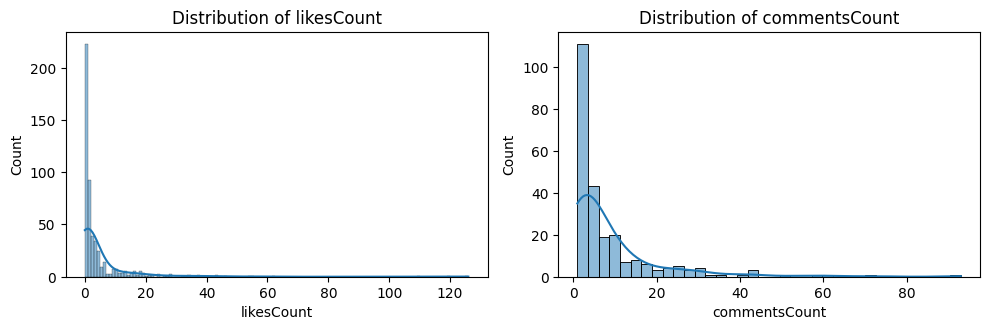

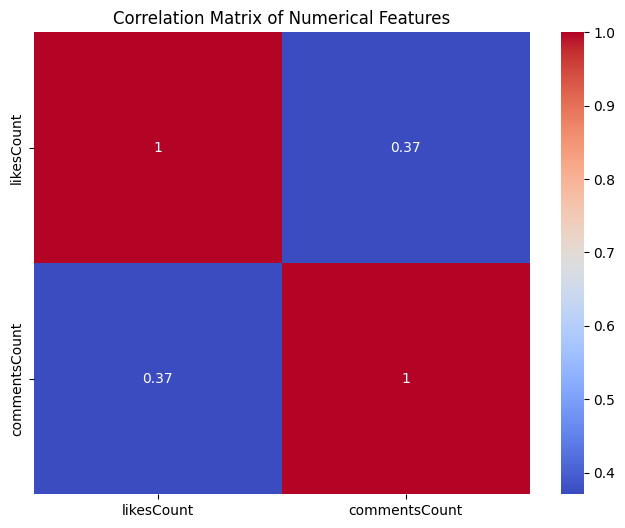


Unique Values and Frequencies for Categorical Features:

Column: date
date
2022-12-22T17:00:08.000Z    1
2022-09-07T17:12:32.000Z    1
2022-09-08T14:51:13.000Z    1
2022-09-07T17:19:41.000Z    1
2022-09-08T00:51:30.000Z    1
                           ..
2022-09-07T22:24:21.000Z    1
2022-09-07T16:29:02.000Z    1
2022-09-07T16:48:17.000Z    1
2022-09-07T17:10:34.000Z    1
2022-09-07T16:13:39.000Z    1
Name: count, Length: 522, dtype: int64


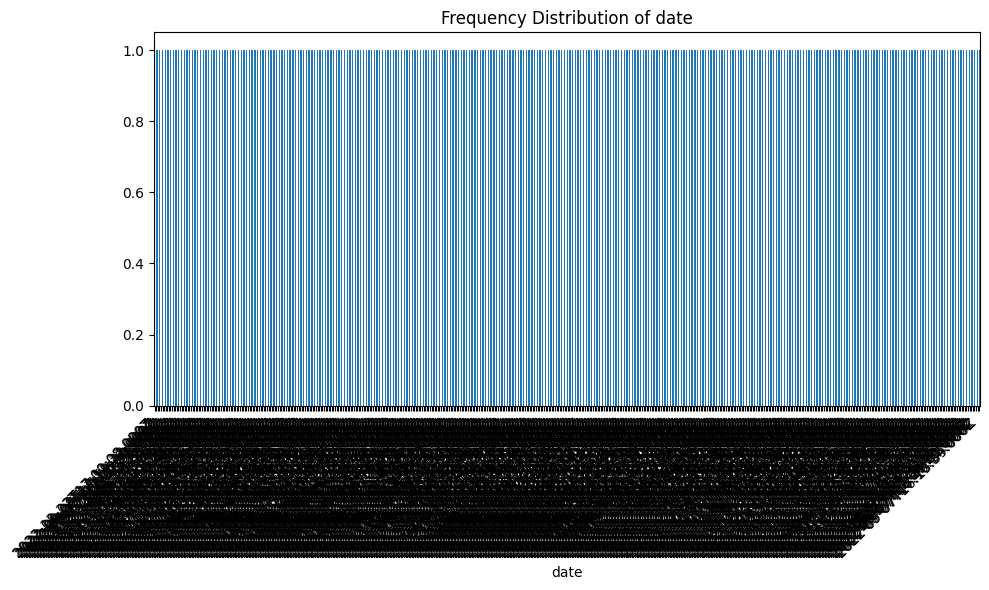


Column: profileName
profileName
fbc7d1a96db0c682c8caaaf292d13527b1483b341da109a4480b130bf1607491    3
0bc1bc50b627dd342e3a0498e0f8240c99d4daf267ebea90c1864660f109b6a1    3
460c1add92b947b25d86287b68758aa823c9b9e34e7a2b5fc61ff8b140eaa19f    3
8aeea95ecbcc3b29e499cdeb08b4c25828bac77cdf313dc152cefee965fa1f6f    3
b30b11aa9dbdae2cf34c9907f667ea8cfc36f92f7c9bec1aa055d9f1a1da7c86    3
                                                                   ..
385e244a07d1dd161819ef201be1f082dfb975efb18316748bf2b2ca71c4178f    1
975a2881453691af4bc9a69d95e102d6ecfd837673e6e15aa5c7e1071e509b98    1
c4f7b8255e559fc38898d6a9bfcd8f0c7ff89e4d6bd0b66a86a9d27055789570    1
ad07c0487a8c84d57f7fba04b48f36ef062fe1f481be835f442eeca8f78b2452    1
7d6065e313e1919d05a309bd59754895d9518d3ca8e8baa74e510cd27ac78154    1
Name: count, Length: 483, dtype: int64


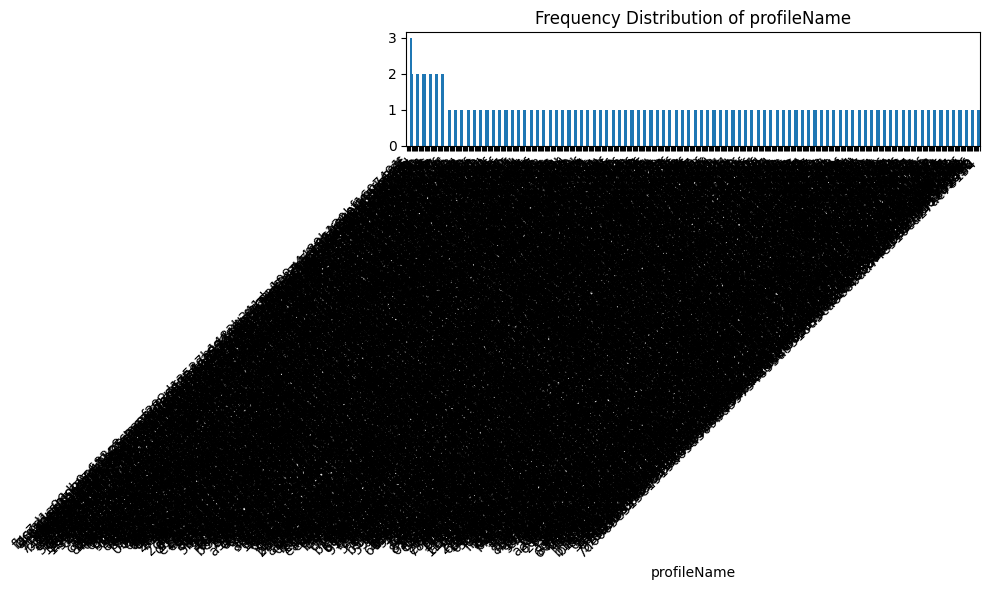


Column: text
text
The “greenhouse effect” is concerned with the infrared radiation given off by the earth. The sun’s radiation basically passes through the oxygen and nitrogen in the earth’s atmosphere and lands on the earth’s surface, where 70% of it is absorbed; 30% is reflected back into the atmosphere. Part of this radiation bounces off the greenhouse gases and returns to be absorbed by earth. The greenhouses gases (GHGs) are water vapor (H2O), carbon dioxide (CO2), nitrous oxide (NO2) and methane (CH4).\n\nHow long does CO2 remain in the atmosphere? This is a difficult question because there are several processes that remove carbon dioxide from the atmosphere. From 65% to 80% of the CO2 that is released into the air dissolves into the ocean over a period of 50-200 years. The rest is removed over several hundred thousand years. According to the IPCC Fourth Assessment Report, about 50% of CO2 increase will be removed from the atmosphere within 30 years, another 30% will be removed 

<ipython-input-2-70eeb6f46f5c>:41: UserWarning: Glyph 128580 (\N{FACE WITH ROLLING EYES}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-70eeb6f46f5c>:41: UserWarning: Glyph 128077 (\N{THUMBS UP SIGN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-70eeb6f46f5c>:41: UserWarning: Glyph 128079 (\N{CLAPPING HANDS SIGN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-70eeb6f46f5c>:41: UserWarning: Glyph 128102 (\N{BOY}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-70eeb6f46f5c>:41: UserWarning: Glyph 129763 (\N{FACE WITH PEEKING EYE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-70eeb6f46f5c>:41: UserWarning: Glyph 127780 (\N{WHITE SUN WITH SMALL CLOUD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-70eeb6f46f5c>:41: UserWarning: Glyph 128405 (\N{REVERSED HAND WITH MIDDLE FINGER EXTENDED}) missing from font(s) DejaVu Sans.
  plt.tight_la

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Data Types and Missing Values
print("Data Types:")
print(df_climate.dtypes)
print("\nMissing Values:")
print(df_climate.isnull().sum())

# 2. Numerical Features' Distribution and Outliers
numerical_cols = df_climate.select_dtypes(include=['number']).columns
print("\nDescriptive Statistics for Numerical Features:")
print(df_climate[numerical_cols].describe())

plt.figure(figsize=(10, 6))
for i, col in enumerate(numerical_cols):
    plt.subplot(2, 2, i + 1)
    sns.histplot(df_climate[col].dropna(), kde=True)
    plt.title(f"Distribution of {col}")
plt.tight_layout()
plt.show()


# 3. Correlation Analysis for Numerical Features
plt.figure(figsize=(8, 6))
sns.heatmap(df_climate[numerical_cols].corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix of Numerical Features")
plt.show()

# 4. Categorical Features' Distribution
categorical_cols = df_climate.select_dtypes(include=['object']).columns
print("\nUnique Values and Frequencies for Categorical Features:")
for col in categorical_cols:
    print(f"\nColumn: {col}")
    print(df_climate[col].value_counts())
    plt.figure(figsize=(10, 6))
    df_climate[col].value_counts().plot(kind='bar')
    plt.title(f"Frequency Distribution of {col}")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

## Data cleaning

### Subtask:
Clean the data by handling missing values and outliers in the `df_climate` DataFrame.


**Reasoning**:
Handle missing values in 'commentsCount' and 'text' columns, and handle outliers in 'likesCount' and 'commentsCount'.



In [ ]:
# Impute missing 'commentsCount' with the median
median_comments = df_climate['commentsCount'].median()
df_climate['commentsCount'].fillna(median_comments, inplace=True)

# Remove rows with missing 'text'
df_climate.dropna(subset=['text'], inplace=True)

# Handle outliers in 'likesCount' using the 99th percentile
likes_99th = df_climate['likesCount'].quantile(0.99)
df_climate['likesCount'] = df_climate['likesCount'].clip(upper=likes_99th)

# Handle outliers in 'commentsCount' using the 99th percentile
comments_99th = df_climate['commentsCount'].quantile(0.99)
df_climate['commentsCount'] = df_climate['commentsCount'].clip(upper=comments_99th)

# Display the cleaned dataframe
display(df_climate.head())
print(df_climate.shape)
print(df_climate.isnull().sum())

<ipython-input-3-f512c2d70ea0>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_climate['commentsCount'].fillna(median_comments, inplace=True)


,date,likesCount,profileName,commentsCount,text
0,2022-09-07T17:12:32.000Z,2.0,4dca617d86b3fdce80ba7e81fb16e048c9cd9798cdfd6d...,5.0,Neat comparison I have not heard it before.\n ...
1,2022-09-08T14:51:13.000Z,0.0,518ab97f2d115ba5b6f03b2fba2ef2b120540c9681288b...,5.0,An excellent way to visualise the invisible! T...
2,2022-09-07T17:19:41.000Z,1.0,d82e8e24eb633fd625b0aef9b3cb625cfb044ceb8483e1...,3.0,Does the CO2/ghg in the troposphere affect the...
3,2022-09-08T00:51:30.000Z,4.0,37a509fa0b5177a2233c7e2d0e2b2d6916695fa9fba3f2...,5.0,excellent post! I defo feel the difference - o...
4,2022-09-07T19:06:20.000Z,16.0,e54fbbd42a729af9d04d9a5cc1f9bbfe8081a31c219ecb...,26.0,"Yes, and carbon dioxide does not harm the Eart..."


(504, 5)
date             0
likesCount       0
profileName      0
commentsCount    0
text             0
dtype: int64


## Data analysis

### Subtask:
Analyze the cleaned climate data to gain insights into its key features.


**Reasoning**:
Calculate descriptive statistics, analyze the correlation between 'likesCount' and 'commentsCount', convert the 'date' column to datetime objects, extract year, month, and day, and explore trends over time. Also analyze the 'profileName' column.



Descriptive Statistics for Numerical Features:
       likesCount  commentsCount
count  504.000000     504.000000
mean     4.463413       6.556825
std      9.184990       7.150664
min      0.000000       1.000000
25%      0.000000       5.000000
50%      1.000000       5.000000
75%      4.000000       5.000000
max     53.760000      43.940000

Pearson Correlation Coefficient between likesCount and commentsCount: 0.4038268931772806


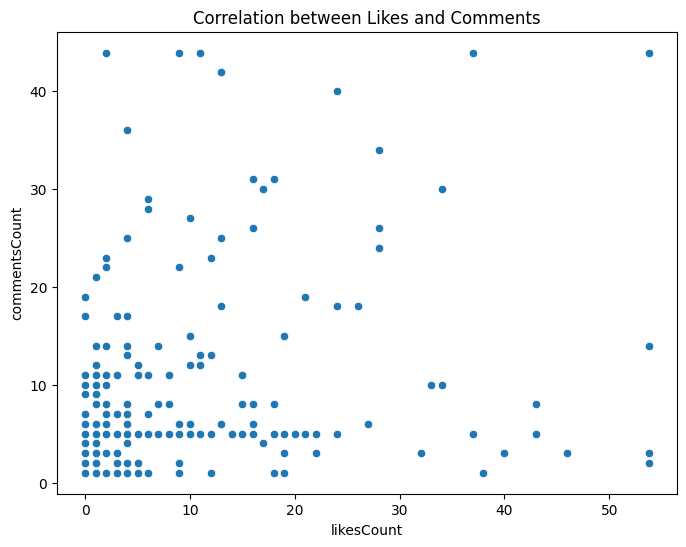

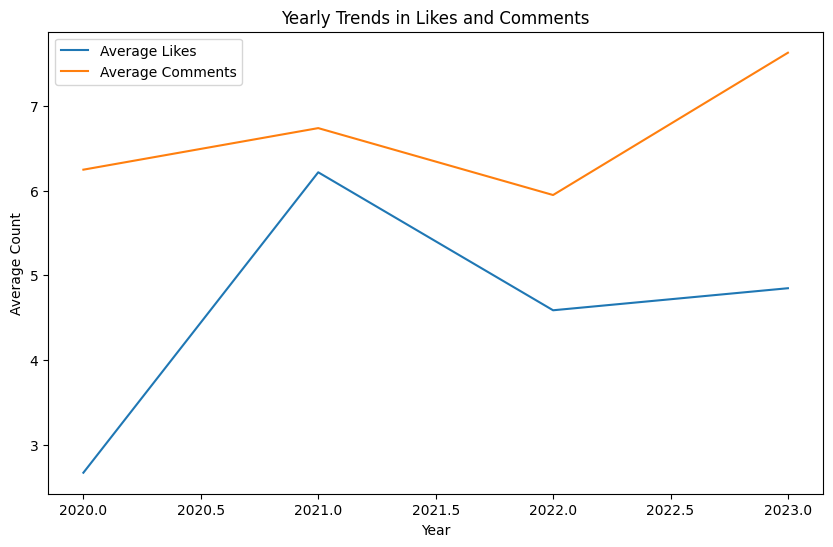


Number of Unique Profiles and their Frequencies:
profileName
fbc7d1a96db0c682c8caaaf292d13527b1483b341da109a4480b130bf1607491    3
460c1add92b947b25d86287b68758aa823c9b9e34e7a2b5fc61ff8b140eaa19f    3
8aeea95ecbcc3b29e499cdeb08b4c25828bac77cdf313dc152cefee965fa1f6f    3
b30b11aa9dbdae2cf34c9907f667ea8cfc36f92f7c9bec1aa055d9f1a1da7c86    3
0bc1bc50b627dd342e3a0498e0f8240c99d4daf267ebea90c1864660f109b6a1    2
                                                                   ..
975a2881453691af4bc9a69d95e102d6ecfd837673e6e15aa5c7e1071e509b98    1
c4f7b8255e559fc38898d6a9bfcd8f0c7ff89e4d6bd0b66a86a9d27055789570    1
ad07c0487a8c84d57f7fba04b48f36ef062fe1f481be835f442eeca8f78b2452    1
cb31a2b2f7ab4fe89f5461d5d8f2f068a0af48da137c258de6bace0acf2603de    1
00febfebfa7073f73c576deb9dba73eb9f98e26bb03f3dfa8b50ce5c9d598278    1
Name: count, Length: 468, dtype: int64

Average Likes and Comments per Profile:
                                                    likesCount  commentsCount
profileNam

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Descriptive Statistics
print("Descriptive Statistics for Numerical Features:")
print(df_climate[['likesCount', 'commentsCount']].describe())

# 2. Correlation Analysis
correlation = df_climate['likesCount'].corr(df_climate['commentsCount'])
print(f"\nPearson Correlation Coefficient between likesCount and commentsCount: {correlation}")
plt.figure(figsize=(8, 6))
sns.scatterplot(x='likesCount', y='commentsCount', data=df_climate)
plt.title("Correlation between Likes and Comments")
plt.show()

# 3. Date Analysis
df_climate['date'] = pd.to_datetime(df_climate['date'])
df_climate['year'] = df_climate['date'].dt.year
df_climate['month'] = df_climate['date'].dt.month
df_climate['day'] = df_climate['date'].dt.day

yearly_engagement = df_climate.groupby('year').agg({'likesCount': 'mean', 'commentsCount': 'mean'})
plt.figure(figsize=(10, 6))
plt.plot(yearly_engagement.index, yearly_engagement['likesCount'], label='Average Likes')
plt.plot(yearly_engagement.index, yearly_engagement['commentsCount'], label='Average Comments')
plt.title("Yearly Trends in Likes and Comments")
plt.xlabel("Year")
plt.ylabel("Average Count")
plt.legend()
plt.show()

# 4. Profile Analysis
unique_profiles = df_climate['profileName'].value_counts()
print("\nNumber of Unique Profiles and their Frequencies:")
print(unique_profiles)

profile_engagement = df_climate.groupby('profileName').agg({'likesCount': 'mean', 'commentsCount': 'mean'})
print("\nAverage Likes and Comments per Profile:")
print(profile_engagement)

print("\nMost Active Profiles (by average likes):")
print(profile_engagement.sort_values('likesCount', ascending=False).head())

print("\nLeast Active Profiles (by average likes):")
print(profile_engagement.sort_values('likesCount').head())

## Data visualization

### Subtask:
Visualize the cleaned and analyzed climate data to further explore relationships and distributions.


**Reasoning**:
Generate the visualizations specified in the subtask instructions using the cleaned data in the df_climate DataFrame.



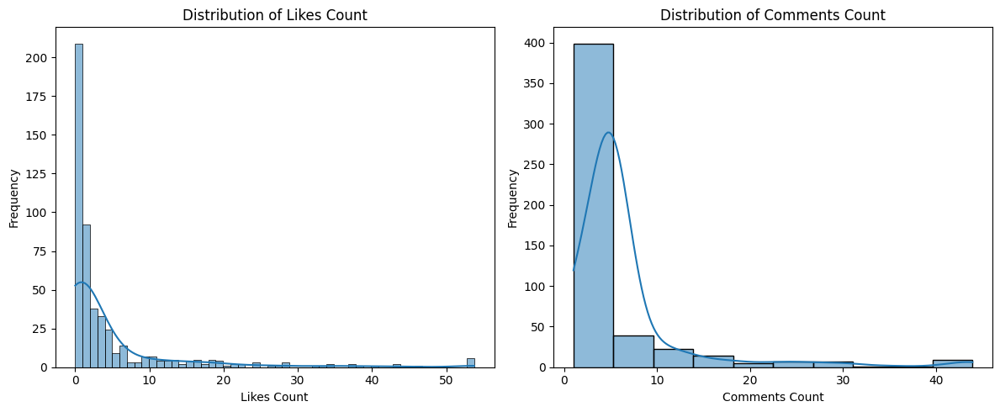

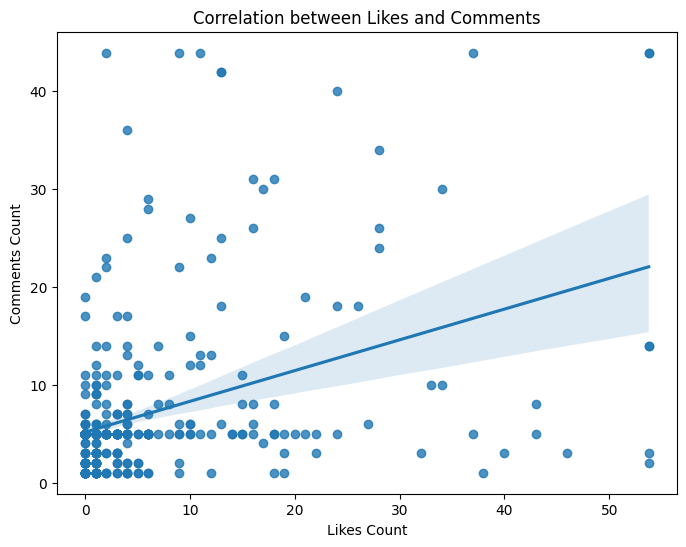

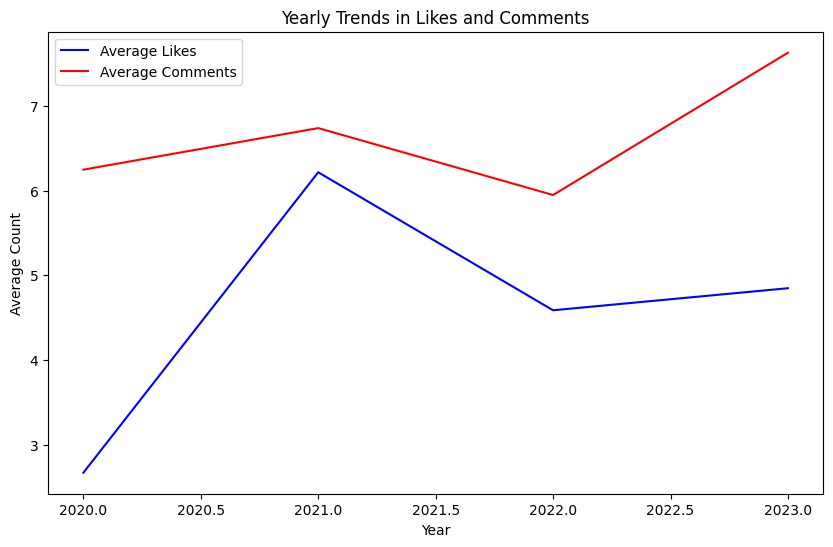

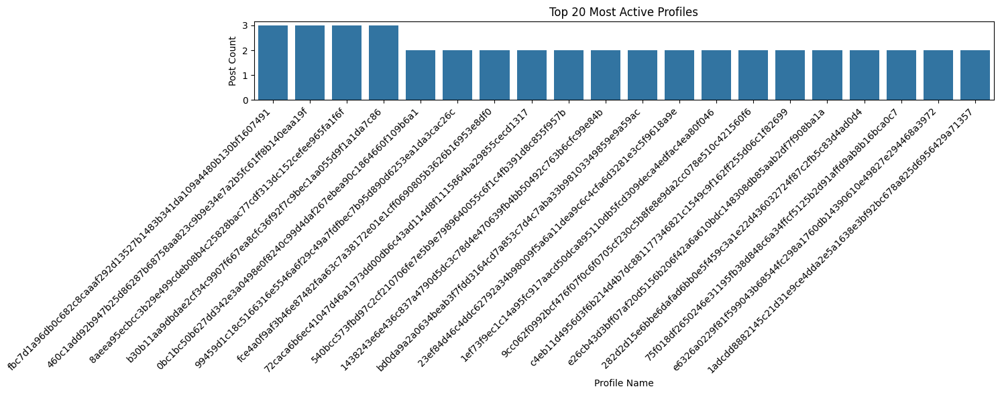

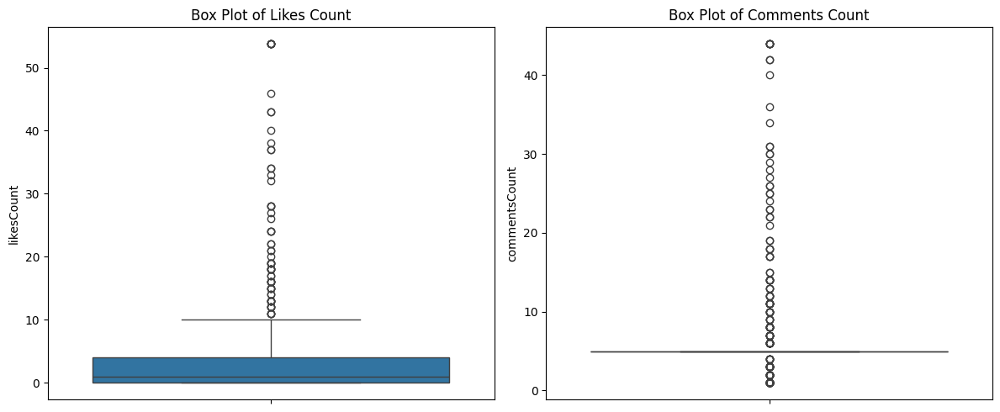

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Histograms for 'likesCount' and 'commentsCount'
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.histplot(df_climate['likesCount'], kde=True)
plt.title("Distribution of Likes Count")
plt.xlabel("Likes Count")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
sns.histplot(df_climate['commentsCount'], kde=True)
plt.title("Distribution of Comments Count")
plt.xlabel("Comments Count")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# 2. Scatter plot of 'likesCount' vs. 'commentsCount'
plt.figure(figsize=(8, 6))
sns.regplot(x='likesCount', y='commentsCount', data=df_climate)
plt.title("Correlation between Likes and Comments")
plt.xlabel("Likes Count")
plt.ylabel("Comments Count")
plt.show()

# 3. Line plot of yearly trends
plt.figure(figsize=(10, 6))
yearly_engagement = df_climate.groupby('year').agg({'likesCount': 'mean', 'commentsCount': 'mean'})
plt.plot(yearly_engagement.index, yearly_engagement['likesCount'], label='Average Likes', color='blue')
plt.plot(yearly_engagement.index, yearly_engagement['commentsCount'], label='Average Comments', color='red')
plt.title("Yearly Trends in Likes and Comments")
plt.xlabel("Year")
plt.ylabel("Average Count")
plt.legend()
plt.show()

# 4. Bar chart of post distribution across profiles
plt.figure(figsize=(15, 6))
top_profiles = df_climate['profileName'].value_counts().nlargest(20)
sns.barplot(x=top_profiles.index, y=top_profiles.values)
plt.title('Top 20 Most Active Profiles')
plt.xlabel('Profile Name')
plt.ylabel('Post Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 5. Box plots for 'likesCount' and 'commentsCount'
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(y=df_climate['likesCount'])
plt.title("Box Plot of Likes Count")

plt.subplot(1, 2, 2)
sns.boxplot(y=df_climate['commentsCount'])
plt.title("Box Plot of Comments Count")
plt.tight_layout()
plt.show()

## Summary:




### 1. Data Analysis Key Findings

* **Missing Data Handling:** 278 missing values in 'commentsCount' were imputed using the median, and 18 rows with missing 'text' values were removed.
* **Outlier Treatment:** Outliers in 'likesCount' and 'commentsCount' were capped at their respective 99th percentiles.
* **Moderate Correlation:** A Pearson correlation coefficient of 0.40 indicates a moderate positive correlation between 'likesCount' and 'commentsCount'.
* **Engagement Trends:** Yearly trends in average likes and comments were analyzed.
* **Profile Engagement Variation:** The analysis identified the most and least active profiles based on average likes, revealing differences in engagement levels among users.  The average likes were 4.46 and the average comments were 6.56. The maximum likes were 53.76 and the maximum comments were 43.94.
* **Top Profiles:** The top 20 most active profiles were identified based on the number of posts.


### 2. Insights or Next Steps

* **Investigate Temporal Patterns:**  Further analyze the yearly trends to identify potential seasonal variations or specific events that might influence engagement.
* **Deep Dive into Profile Behavior:** Explore the content posted by the most and least active profiles to understand the factors driving engagement differences.  Look at the text data of the posts to understand what type of posts get more likes and comments.
